In [49]:
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
from sympy.utilities import lambdify
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [23]:
sp.init_printing()

In [24]:
x = sp.Symbol('x', real=True)
k = sp.Symbol('k', real=True, positive=True)
a = sp.Symbol('a', real=True)
m = sp.Symbol('m', real=True, positive=True)
t = sp.Symbol('t', real=True, positive=True)
h = sp.Symbol('hbar', real=True, positive=True)
n = sp.Symbol('n', integer=True, nonzero=True)
psi = sp.Function('psi')

x, k, a, m, t, h, n, psi(x)

$$\frac{d^2\psi(x)}{dx^2} = -k^2\psi(x)$$

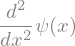

In [25]:
psi(x).diff(x, x)

In [26]:
-k**2 * psi(x)

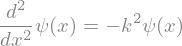

In [27]:
eq = sp.Eq(psi(x).diff(x, x), -k**2 * psi(x))
eq

In [28]:
sp.dsolve(eq, psi(x))

In [29]:
sp.dsolve(eq, psi(x), ics={psi(0): 0, psi(a): 0})

In [30]:
sol = sp.dsolve(eq, psi(x), ics={psi(0): 0})
sol

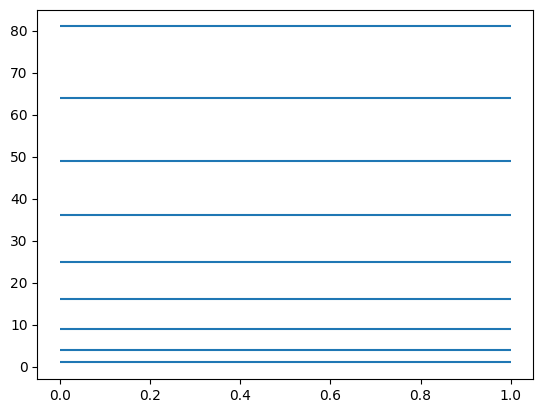

In [31]:
plt.hlines(np.arange(1, 10)**2, 0, 1)

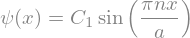

In [32]:
sol = sol.subs(k, n * sp.pi / a)
sol

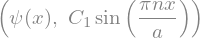

In [33]:
sol.lhs, sol.rhs

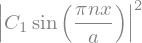

In [34]:
sp.Abs(sol.rhs)**2

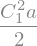

In [35]:
sp.integrate(sol.rhs**2, (x, 0, a))

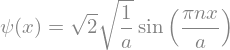

In [37]:
sol = sol.subs(sp.Symbol('C1'), sp.sqrt(2 / a))
sol

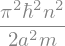

In [39]:
En = n**2 * sp.pi**2 * h**2 / (2 * m * a**2)
En

In [40]:
phi = sp.exp(-sp.I * En * t / h)
phi

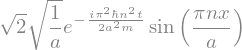

In [42]:
Psi = sol.rhs * phi
Psi

In [44]:
Psif = lambdify((x, t, n), Psi.subs({a: 1, m: 1, h: 1}))
Psif

<function _lambdifygenerated(x, t, n)>

In [45]:
Psif(0.3, 2.3, 1)

(0.3971182633717983+1.0729930471683005j)

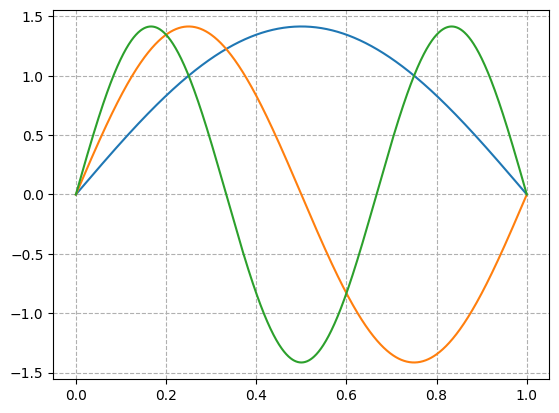

In [48]:
xs = np.linspace(0, 1, 1000)

plt.grid(linestyle='--')

ys = Psif(xs, 0, 1).real
plt.plot(xs, ys)

ys = Psif(xs, 0, 2).real
plt.plot(xs, ys)

ys = Psif(xs, 0, 3).real
plt.plot(xs, ys)

In [52]:
n = 3

xs = np.linspace(0, 1, 1000)

fig = plt.figure()

plt.xlim(0, 1)
plt.ylim(-1.5, 1.5)

plot1, = plt.plot([], [])
plot2, = plt.plot([], [])

plt.close()

dt = 0.001

def frame(i):
    ys = Psif(xs, i * dt, n)

    plot1.set_data(xs, ys.real)
    plot2.set_data(xs, ys.imag)

    return plot1, plot2

anim = FuncAnimation(fig, frame, frames=300, interval=20, blit=True)
HTML(anim.to_jshtml())

In [53]:
n = 1

xs = np.linspace(0, 1, 1000)

fig = plt.figure()

plt.xlim(0, 1)
plt.ylim(0, 3)

plot1, = plt.plot([], [])


plt.close()

dt = 0.001

def frame(i):
    ys = Psif(xs, i * dt, n)

    plot1.set_data(xs, np.abs(ys)**2)

    return plot1,

anim = FuncAnimation(fig, frame, frames=300, interval=20, blit=True)
HTML(anim.to_jshtml())

RuntimeError: The animation function must return a sequence of Artist objects.